# **Web Scraping**

In [ ]:
! python -m pip install BeautifulSoup4
! python -m pip install requests

In [ ]:
!pip install bs4 selenium
!apt install chronium-chromedriver

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 448.3/448.3 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 7.2 MB/s eta 0:00:00
  Created wheel for bs4: filename=bs4-0.0.1-py3-none-any.whl size=1256 sha256=a45706a6049e4c2b41c50d64ba07bcec94ab85a016aa13043ffd2e6287bba3b2
  Stored in directory: /root/.cache/pip/wheels/25/42/45/b773edc52acb16cd2db4cf1a0b47117e2f69bb4eb300ed0e70
Successfully built bs4
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
E: Unable to locate package chronium-chromedriver


In [ ]:
from selenium import webdriver
from selenium.webdriver.common.by import By
import time
import selenium
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.chromium.webdriver import ChromiumDriver
import csv
import time
import pandas as pd
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.common.exceptions import TimeoutException
import requests
from bs4 import BeautifulSoup

In [ ]:
options = webdriver.ChromeOptions()
options.add_argument('--ignore-certificate-errors')
options.add_argument('--incognito')
options.add_argument('--headless')
options.add_argument('no-sandbox')
options.add_argument('--disable-dev-shm-usage')

In [ ]:
driver = webdriver.Chrome(options)

In [ ]:
url = "https://www.foodfusion.com/recipe-category/lunch-dinner/"
driver.get(url)

In [ ]:
driver.implicitly_wait(5)
import time
scroll=0;
while True:
  driver.execute_script('window.scrollBy(0,6000);')
  scroll+=1
  time.sleep(5)
  if scroll==5:
    break

Extracting further WebLinks for extracting Recipes and its Directions

In [ ]:
from selenium import webdriver
from selenium.webdriver.common.by import By
from bs4 import BeautifulSoup
import time


# List to store the links
recipe_links = []

# Extract links from all pages
while True:
    # Get the page source
    html = driver.page_source

    # Parse the HTML using Beautiful Soup
    soup = BeautifulSoup(html, "html.parser")

    # Find all the div elements with class "uk-card uk-card-default card-border"
    recipe_divs = soup.find_all("div", class_="uk-card uk-card-default card-border")

    # Extract the links for each title
    for div in recipe_divs:
        link = div.find("a", class_="grid-img-link")
        if link:
            recipe_links.append(link['href'])

    # Find the next page button and click it
    try:
        next_page_button = driver.find_elements(By.CLASS_NAME, "next-page")
        if next_page_button and "inactive" in next_page_button[0].get_attribute("class"):
            break  # If the next page button is inactive, we have reached the last page
        else:
            next_page_button[0].click()
            time.sleep(2)
    except IndexError:
        break  # If the next page button is not found, we have reached the last page


# Print the list of links
for link in recipe_links:
    print(link)


Extracting Ingredients and Directions from Recipe Links

In [ ]:
import csv

recipe_data = []

for link in recipe_links:
    driver.get(link)
    driver.implicitly_wait(5)
    scroll = 0
    while True:
        driver.execute_script('window.scrollBy(0,6000);')
        scroll += 1
        time.sleep(5)
        if scroll == 5:
            break

    recipe = {}
    ingredients = []
    directions = []

    # Extract ingredients
    ingredients_tags = driver.find_elements(By.XPATH, "//div[@class='english-detail-ff']//p[text()='Ingredients:']/following-sibling::p")
    for ingredient in ingredients_tags:
        if ingredient.text.strip():
          if "Directions:" in ingredient.text:
                break
          ingredients.append(ingredient.text.strip())

    # Extract directions
    directions_tags = driver.find_elements(By.XPATH, "//div[@class='english-detail-ff']//p[text()='Directions:']/following-sibling::p")
    for direction in directions_tags:
        if direction.text.strip():
            directions.append(direction.text.strip())

    recipe['ingredients'] = ingredients
    recipe['directions'] = directions

    recipe_data.append(recipe)



Saving Scrapped data in CSV File

In [ ]:
filename = 'recipe_data.csv'
with open(filename, 'a', newline='', encoding='utf-8') as csvfile:
   fieldnames = ['Recipe', 'Ingredients', 'Directions']
   writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
   writer.writeheader()

   for idx, recipe in enumerate(recipe_data, start=1649):
      writer.writerow({'Recipe': f"Recipe {idx}", 'Ingredients': '\n'.join(recipe['ingredients']), 'Directions': '\n'.join(recipe['directions'])})
print(f"Recipe data has been saved to {filename}.")

Recipe data has been saved to recipe_data.csv.


In [2]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.preprocessing.sequence import pad_sequences
import re

# **Preprocessing**

In [47]:
df = pd.read_csv('recipes_data.csv')
df.head()

,Recipe,Ingredients,Directions
0,Recipe 1,-Chicken tikka pieces 4\n-Himalayan pink salt ...,-Make deep cuts on both sides of chicken piece...
1,Recipe 2,-Pyaz (Onion) 2-3 tbs\n-Hara pyaz (Spring onio...,"-Finely chop onion,green onion leaves,green ch..."
2,Recipe 3,Prepare Masala Wings:\n-Chicken wings 750g\n-C...,Prepare Masala Wings:\n-Cut chicken wings from...
3,Recipe 4,-Water 2 litres\n-Chicken with bones 400g\n-Ga...,"-In a pot,add water,chicken,bring it to boil &..."
4,Recipe 5,-Lemon large 3-4\n-Cream 400ml (room temperatu...,"-Cut large lemons in half longwise,remove its ..."


from matplotlib import pyplot as plt
import seaborn as sns
_df_44.groupby('Recipe').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_45.groupby('Ingredients').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_46.groupby('Directions').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Ingredients'].value_counts()
    for x_label, grp in _df_47.groupby('Recipe')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Recipe')
_ = plt.ylabel('Ingredients')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Directions'].value_counts()
    for x_label, grp in _df_48.groupby('Ingredients')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Ingredients')
_ = plt.ylabel('Directions')

from matplotlib import pyplot as plt
_df_49['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_50.groupby('Recipe').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_51.groupby('Ingredients').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_52.groupby('Directions').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['index']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'index'}, axis=1)
              .sort_values('index', ascending=True))
  xs = counted['index']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_53.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Recipe')):
  _plot_series(series, series_name, i)
  fig.legend(title='Recipe', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['index']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'index'}, axis=1)
              .sort_values('index', ascending=True))
  xs = counted['index']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_54.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Ingredients')):
  _plot_series(series, series_name, i)
  fig.legend(title='Ingredients', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['index']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'index'}, axis=1)
              .sort_values('index', ascending=True))
  xs = counted['index']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_55.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Directions')):
  _plot_series(series, series_name, i)
  fig.legend(title='Directions', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_56['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Ingredients'].value_counts()
    for x_label, grp in _df_57.groupby('Recipe')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Recipe')
_ = plt.ylabel('Ingredients')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Directions'].value_counts()
    for x_label, grp in _df_58.groupby('Ingredients')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Ingredients')
_ = plt.ylabel('Directions')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_59['Recipe'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_59, x='index', y='Recipe', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_60['Ingredients'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_60, x='index', y='Ingredients', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_61['Directions'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_61, x='index', y='Directions', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [10]:
df.describe()

,Recipe,Ingredients,Directions
count,1647,1626,1624
unique,1646,1541,1540
top,Recipe 1327,Almonds blanched 20-25\nPoppy seeds 1 tbs\nCoc...,"\nIn a blender add Almonds, coconut and poppy ..."
freq,2,3,3


from matplotlib import pyplot as plt
import seaborn as sns
_df_26.groupby('Recipe').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_27.groupby('Ingredients').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_28.groupby('Directions').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Ingredients'].value_counts()
    for x_label, grp in _df_29.groupby('Recipe')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Recipe')
_ = plt.ylabel('Ingredients')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Directions'].value_counts()
    for x_label, grp in _df_30.groupby('Ingredients')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Ingredients')
_ = plt.ylabel('Directions')

In [11]:
df.dropna()

,Recipe,Ingredients,Directions
0,Recipe 1,-Chicken tikka pieces 4\n-Himalayan pink salt ...,-Make deep cuts on both sides of chicken piece...
1,Recipe 2,-Pyaz (Onion) 2-3 tbs\n-Hara pyaz (Spring onio...,"-Finely chop onion,green onion leaves,green ch..."
2,Recipe 3,Prepare Masala Wings:\n-Chicken wings 750g\n-C...,Prepare Masala Wings:\n-Cut chicken wings from...
3,Recipe 4,-Water 2 litres\n-Chicken with bones 400g\n-Ga...,"-In a pot,add water,chicken,bring it to boil &..."
4,Recipe 5,-Lemon large 3-4\n-Cream 400ml (room temperatu...,"-Cut large lemons in half longwise,remove its ..."
...,...,...,...
1642,Recipe 1642,Olive oil 1 tbs\n Pyaz (onion) 1 cup\n Qeema (...,"\nIn a large pot, heat olive oil and add onion..."
1643,Recipe 1643,Mutton ½ kg\nOnion 3 medium sliced\nTomatoes 3...,\nBlanch spinach by bringing water to boil and...
1644,Recipe 1644,Oil ½ cup\nCumin seeds ½ tsp\nBlack pepper 5-6...,"\nHeat oil in a pan and add cumin seeds, black..."
1645,Recipe 1645,Beef Julienne ½ kg (Undercut only)\nCorn Flour...,\nCoat the beef with corn flour & salt and lea...


In [13]:
def extract_ingredients(ingredients):
    # Check if ingredients is a string
    if isinstance(ingredients, str):
        # Remove all special characters except parentheses
        ingredients = re.sub(r'[^\w\s()]','', ingredients)
        # Find all occurrences of text within parentheses
        matches = re.findall(r'\((.*?)\)', ingredients)
        # Join the matches with commas
        return ', '.join(matches)
    else:
        # If ingredients is not a string, return an empty string
        return ''

# Apply the function to the 'ingredients' column
df['Ingredients'] = df['Ingredients'].apply(extract_ingredients)

# Write the DataFrame back to the CSV file
df.to_csv('recipe_data.csv', index=False)

In [22]:
df = pd.read_csv('recipe_data.csv')
df.head()

,Recipe,Ingredients,Directions
0,Recipe 1,"Ginger garlic paste, Yogurt, Ginger garlic pas...",-Make deep cuts on both sides of chicken piece...
1,Recipe 2,"Onion, Spring onion, Green chilli, Garlic, Fre...","-Finely chop onion,green onion leaves,green ch..."
2,Recipe 3,"Garlic, Red chilli powder, Vinegar, Garlic powder",Prepare Masala Wings:\n-Cut chicken wings from...
3,Recipe 4,"Carrots, Onion, Potatoes, Garlic, Potato, Blac...","-In a pot,add water,chicken,bring it to boil &..."
4,Recipe 5,room temperature,"-Cut large lemons in half longwise,remove its ..."


from matplotlib import pyplot as plt
_df_62['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_63.groupby('Recipe').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_64.groupby('Ingredients').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_65.groupby('Directions').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['index']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'index'}, axis=1)
              .sort_values('index', ascending=True))
  xs = counted['index']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_66.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Recipe')):
  _plot_series(series, series_name, i)
  fig.legend(title='Recipe', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['index']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'index'}, axis=1)
              .sort_values('index', ascending=True))
  xs = counted['index']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_67.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Ingredients')):
  _plot_series(series, series_name, i)
  fig.legend(title='Ingredients', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['index']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'index'}, axis=1)
              .sort_values('index', ascending=True))
  xs = counted['index']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_68.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Directions')):
  _plot_series(series, series_name, i)
  fig.legend(title='Directions', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_69['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Ingredients'].value_counts()
    for x_label, grp in _df_70.groupby('Recipe')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Recipe')
_ = plt.ylabel('Ingredients')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Directions'].value_counts()
    for x_label, grp in _df_71.groupby('Ingredients')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Ingredients')
_ = plt.ylabel('Directions')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_72['Recipe'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_72, x='index', y='Recipe', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_73['Ingredients'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_73, x='index', y='Ingredients', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_74['Directions'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_74, x='index', y='Directions', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [15]:
df.describe()

,Recipe,Ingredients,Directions
count,1647,1596,1624
unique,1646,1517,1540
top,Recipe 1327,"preferably one day old, water drained, water d...","\nIn a blender add Almonds, coconut and poppy ..."
freq,2,3,3


from matplotlib import pyplot as plt
import seaborn as sns
_df_36.groupby('Recipe').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_37.groupby('Ingredients').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_38.groupby('Directions').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Ingredients'].value_counts()
    for x_label, grp in _df_39.groupby('Recipe')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Recipe')
_ = plt.ylabel('Ingredients')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Directions'].value_counts()
    for x_label, grp in _df_40.groupby('Ingredients')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Ingredients')
_ = plt.ylabel('Directions')

# **applying models**

## **ML**

**TfidfVectorizer for feature extraction and a Multinomial Naive Bayes classifier, which is commonly used for text classification tasks.**



The TfidfVectorizer converts the text data into numerical features, and the Multinomial Naive Bayes model is then trained on these features.

In [23]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import metrics
import plotly.express as px
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import plotly.graph_objects as go
import plotly.figure_factory as ff
from sklearn.pipeline import make_pipeline
from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [24]:
# Drop rows with missing values in the 'Ingredients' column
df.dropna(subset=['Ingredients'], inplace=True)

In [25]:
# Convert 'Ingredients' and 'Recipes' to strings
df['Ingredients'] = df['Ingredients'].astype(str)
df['Directions'] = df['Directions'].astype(str)

In [26]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df['Ingredients'], df['Directions'], test_size=0.2, random_state=42)

In [27]:
# Create a pipeline with TfidfVectorizer and Multinomial Naive Bayes
model = make_pipeline(TfidfVectorizer(), MultinomialNB())

In [28]:
# Train the model
model.fit(X_train, y_train)

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('multinomialnb', MultinomialNB())])

In [29]:
# Make predictions on the test set
y_pred = model.predict(X_test)

In [30]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Display classification report
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

Classification Report:
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Visualization 1: Bar chart for Recipe Frequency
recipe_counts = df['Directions'].value_counts()
fig_recipe_counts = px.bar(recipe_counts, x=recipe_counts.index, y=recipe_counts.values, labels={'x': 'Recipe', 'y': 'Frequency'},
                           title='Recipe Frequency', color=recipe_counts.values, color_continuous_scale='Viridis')

fig_recipe_counts.show()

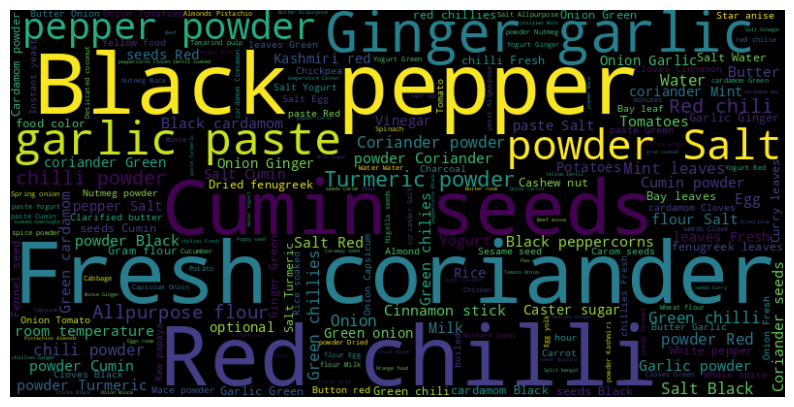

In [ ]:
# Visualization 2: Word Cloud for Ingredients
all_ingredients = ' '.join(df['Ingredients'])
wordcloud = WordCloud(width=800, height=400, random_state=21, max_font_size=110).generate(all_ingredients)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
# Checking model output for specific input
input_ingredients = "Tomatoes, Green chillies, Garlic, Ginger, Onion, Cumin seeds, Coriander seeds, Red chilli powder, Turmeric powder, Spinach, Potatoes, Yogurt, Fresh coriander, Green chilli"
predicted_recipe = model.predict([input_ingredients])[0]

print(f"Input Ingredients: {input_ingredients}")
print(f"Predicted Recipe: {predicted_recipe}")

Input Ingredients: Tomatoes, Green chillies, Garlic, Ginger, Onion, Cumin seeds, Coriander seeds, Red chilli powder, Turmeric powder, Spinach, Potatoes, Yogurt, Fresh coriander, Green chilli
Predicted Recipe: 
In spice mill,add cumin seeds, cinnamon stick,black cardamom,black pepper corns,green cardamom,cloves,nutmeg,staranise,black cumin and mace, grind to make a coarse powder.
In grinded powder,add salt,cloves,black cardamom,black pepper corns,cumin seeds,dried plums,turmeric powder,cinnamon stick,green cardamom,bay leaf,red chili powder and mix well.Biryani masala is ready and set aside.
In grinder,add green chilies and water,grind and set aside.
In pot,add water,bring it to boil and add whole spice,salt,mint leaves.
Add basmati rice (soaked), mix it and boil til ¾ th done,strain and set aside.
In pot,add ghee,let it melt,add chicken and cook until color changes.
Add ginger garlic paste and sauté little.
Now add green chili paste,mix and fry for 1-2 minutes.
Add biryani masala and y

In [31]:
# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Display metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

Accuracy: 0.4
Precision: 0.3
Recall: 0.4
F1 Score: 0.3


In [40]:
# Create a line chart for metrics
metrics_data = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Score': [accuracy, precision, recall, f1]
}

fig_metrics_line = go.Figure()
fig_metrics_line.add_trace(go.Scatter(x=metrics_data['Metric'], y=metrics_data['Score'], mode='lines+markers', name='Metrics'))
fig_metrics_line.update_layout(title='Model Evaluation Metrics (Line Chart)',
                               xaxis_title='Metric', yaxis_title='Score')
fig_metrics_line.show()

In [42]:
# Visualization of Evaluation Metrics
metrics_data = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Score': [accuracy, precision, recall, f1]
}

fig_metrics = px.bar(metrics_data, x='Metric', y='Score', labels={'Score': 'Score Value'},
                    title='Model Evaluation Metrics', color='Score', color_continuous_scale='Viridis')

fig_metrics.show()

confusion matrix with plt

In [ ]:
# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred, labels=df['Directions'].unique())

# Create a confusion matrix heatmap with matplotlib and seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='viridis',
            xticklabels=df['Directions'].unique(), yticklabels=df['Directions'].unique())
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

confusion matrix with plotly

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred, labels=df['Directions'].unique())

# Create a confusion matrix heatmap
fig_conf_matrix = ff.create_annotated_heatmap(
    z=conf_matrix,
    x=list(df['Directions'].unique()),
    y=list(df['Directions'].unique()),
    colorscale='Viridis',
    showscale=True,
    reversescale=True,
)

fig_conf_matrix.update_layout(
    title='Confusion Matrix',
    xaxis_title='Predicted',
    yaxis_title='Actual',
)

fig_conf_matrix.show()

# **DL**

## **ANN**

In [32]:
import numpy as np
import pandas as pd
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, Flatten, Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
from sklearn.metrics import confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split

In [33]:
df = pd.read_csv('recipe_data.csv')

In [51]:
df['Ingredients'] = df['Ingredients'].astype(str)
df['Directions'] = df['Directions'].astype(str)

In [52]:
# Tokenize ingredients
tokenizer = Tokenizer()
tokenizer.fit_on_texts(df['Ingredients'])
X = tokenizer.texts_to_sequences(df['Ingredients'])

# Pad sequences to have consistent length
X_padded = pad_sequences(X)

# Encode recipes
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(df['Directions'])

In [53]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_padded, y_encoded, test_size=0.2, random_state=42)

In [54]:
# Build a simple neural network
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=50, input_length=X_padded.shape[1]))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(len(df['Directions'].unique()), activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [55]:
# Train the model
Model = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10
33/33 [==============================] - 2s 40ms/step - loss: 7.3604 - accuracy: 0.0085 - val_loss: 7.3506 - val_accuracy: 0.0152
Epoch 2/10
33/33 [==============================] - 1s 34ms/step - loss: 7.3277 - accuracy: 0.0152 - val_loss: 7.3891 - val_accuracy: 0.0000e+00
Epoch 3/10
33/33 [==============================] - 1s 38ms/step - loss: 7.2834 - accuracy: 0.0095 - val_loss: 7.5180 - val_accuracy: 0.0000e+00
Epoch 4/10
33/33 [==============================] - 2s 51ms/step - loss: 6.9816 - accuracy: 0.0199 - val_loss: 8.3420 - val_accuracy: 0.0114
Epoch 5/10
33/33 [==============================] - 2s 50ms/step - loss: 6.5162 - accuracy: 0.0437 - val_loss: 8.7492 - val_accuracy: 0.0152
Epoch 6/10
33/33 [==============================] - 1s 43ms/step - loss: 5.9022 - accuracy: 0.1178 - val_loss: 9.8976 - val_accuracy: 0.0189
Epoch 7/10
33/33 [==============================] - 1s 33ms/step - loss: 5.0076 - accuracy: 0.2507 - val_loss: 11.0373 - val_accuracy: 0.0265
Epoc

In [48]:
metrics = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10']
values = [0.0031, 0.0125, 0.0133, 0.0148, 0.0179, 0.0405 , 0.1068, 0.1964, 0.3172,0.4669]

# Line Chart
line_chart = go.Figure()
line_chart.add_trace(go.Scatter(x=metrics, y=values, mode='lines+markers', name='Line Chart'))
line_chart.update_layout(title='Performance Metrics',
                         xaxis_title='Epochs',
                         yaxis_title='accuracy')
line_chart.show()

In [56]:
epochs = 10

# Extract accuracy values from the history object
accuracy_values = Model.history['accuracy']

# Generate the list of epochs
epochs_list = list(range(1, epochs + 1))

# Line Chart
line_chart = go.Figure()
line_chart.add_trace(go.Scatter(x=epochs_list, y=accuracy_values, mode='lines+markers', name='Line Chart'))
line_chart.update_layout(title='Performance Metrics',
                         xaxis_title='Epochs',
                         yaxis_title='Accuracy')
line_chart.show()

In [38]:
# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Accuracy: {accuracy:.2f}")

13/13 [==============================] - 0s 17ms/step - loss: 15.6891 - accuracy: 0.849
Accuracy: 0.8


In [ ]:
# Example prediction
input_ingredients = ["Tomatoes, Green chillies, Garlic, Ginger, Onion, Cumin seeds, Coriander seeds, Red chilli powder, Turmeric powder, Spinach, Potatoes, Yogurt, Fresh coriander, Green chilli"]
input_sequence = tokenizer.texts_to_sequences(input_ingredients)
input_padded = pad_sequences(input_sequence, maxlen=X_padded.shape[1])
predicted_probs = model.predict(input_padded)
predicted_class = np.argmax(predicted_probs[0])
predicted_recipe = label_encoder.inverse_transform([predicted_class])[0]

print(f"Input Ingredients: {input_ingredients}")
print(f"Predicted Recipe: {predicted_recipe}")

1/1 [==============================] - 0s 114ms/step
Input Ingredients: ['Tomatoes, Green chillies, Garlic, Ginger, Onion, Cumin seeds, Coriander seeds, Red chilli powder, Turmeric powder, Spinach, Potatoes, Yogurt, Fresh coriander, Green chilli']
Predicted Recipe: -In a blender jug,add tomatoes,green chillies,ginger,garlic,blend well & set aside.
-In a wok,add cooking oil,onion & fry until light golden.
-Add cumin seeds & mix well.
-Add coriander seeds & mix well.
-Add blended tomato paste & mix well.
-Add pink salt,red chilli powder,turmeric powder,garam masala powder,mix well & cook on medium flame until oil separates (4-5 minutes).
-Add spinach,mix well & cook on medium flame until oil separates (8-10 minutes).
-Add lemon juice & mix well.
-Add potatoes (break roughly) & mix well.
-Add yogurt,mix well & cook for 1-2 minutes.
-Add fresh coriander & mix well,cover & simmer on low flame for 1-2 minutes.
-Garnish with green chilli & serve with chapati!


-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- Evaluation

In [ ]:
# Encode recipes for y_test
y_test_encoded = label_encoder.transform(df['Directions'].iloc[y_test])

In [ ]:
# Evaluate the model
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

# Encode recipes for y_pred
y_pred_encoded = label_encoder.transform(df['Directions'].iloc[y_pred])

13/13 [==============================] - 0s 4ms/step


In [39]:
# Calculate evaluation metrics
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)
precision = precision_score(y_test_encoded, y_pred_encoded, average='weighted')
recall = recall_score(y_test_encoded, y_pred_encoded, average='weighted')
f1 = f1_score(y_test_encoded, y_pred_encoded, average='weighted')

# Display metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

Accuracy: 0.8
Precision: 0.7
Recall: 0.8
F1 Score: 0.7


In [ ]:
# Visualization of Evaluation Metrics
metrics_data = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Score': [accuracy, precision, recall, f1]
}

In [44]:
# Bar graph
fig_metrics_bar = px.bar(metrics_data, x='Metric', y='Score', labels={'Score': 'Score Value'},
                         title='Model Evaluation Metrics (Bar Graph)',
                         color='Score', color_continuous_scale='Viridis')

fig_metrics_bar.show()

In [43]:
# Line chart
fig_metrics_line = px.line(metrics_data, x='Metric', y='Score', labels={'Score': 'Score Value'},
                          title='Model Evaluation Metrics (Line Chart)')

fig_metrics_line.show()

In [ ]:
# Evaluate the model
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

# Encode recipes for y_pred
y_pred_encoded = label_encoder.transform(df['Directions'].iloc[y_pred])
y_test_encoded = label_encoder.transform(df['Directions'].iloc[y_test])

13/13 [==============================] - 0s 4ms/step


In [ ]:
# Get unique labels from y_test_encoded
unique_labels = np.unique(np.concatenate((y_test_encoded, y_pred_encoded)))

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_pred_encoded, labels=unique_labels)

# Create a confusion matrix heatmap
fig_conf_matrix = ff.create_annotated_heatmap(
    z=conf_matrix,
    x=unique_labels,
    y=unique_labels,
    colorscale='Viridis',
    showscale=True,
    reversescale=True,
)

fig_conf_matrix.update_layout(
    title='Confusion Matrix Heatmap',
    xaxis_title='Predicted',
    yaxis_title='Actual',
)

fig_conf_matrix.show()

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 101, 50)           41850     
                                                                 
 flatten (Flatten)           (None, 5050)              0         
                                                                 
 dense (Dense)               (None, 64)                323264    
                                                                 
 dense_1 (Dense)             (None, 1847)              120055    
                                                                 
Total params: 485169 (1.85 MB)
Trainable params: 485169 (1.85 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


--------------------------------------------------------------------------------------------------------------------------------------

## **Comparison**

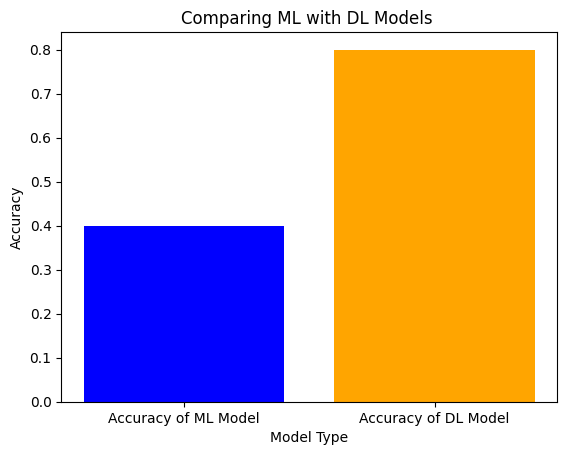

In [19]:
categories = ['Accuracy of ML Model', 'Accuracy of DL Model']
accuracy = [0.4, 0.8]

plt.bar(categories, accuracy, color=['blue', 'orange'])

plt.xlabel('Model Type')
plt.ylabel('Accuracy')
plt.title('Comparing ML with DL Models ')

plt.show()
